# CLIP Model for Image-Label Matching

This notebook creates a CLIP model to find images based on their labels using captions.

In [1]:
import pandas as pd
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt


RANDOM_STATE = 42
SUBSET_SIZE = 500
UNCAPTIONED_SIZE = 5
TRAIN_MODEL = True
SAVE_MODEL = True
SAVE_PATH = Path(".")

## Load Photo Details Data

In [2]:
# Load photo details
photo_details_path = "../../data/clean/photo_details.parquet"
photo_df = pd.read_parquet(photo_details_path)

print(f"Total photos: {len(photo_df)}")
print(f"\nDataset shape: {photo_df.shape}")
photo_df.head()

Total photos: 200100

Dataset shape: (200100, 4)


,photo_id,business_id,caption,label
0,EW7J8ghM8lQVvPGdhuze3w,M-6AXSgmDMYcWsF442mzzA,Patio,outside
1,jKy9B8UlZzwgxqK-4k2xxg,enGdNBy61DeTBZC_ylEC3w,Singapore Black Pepper Chicken,food
2,zPv7HseGyDgpuPBWgFbWag,9cu2p2Z925hHkWHVyrp1JQ,,food
3,IarrfS8t6F8lmLCmhc5Yow,oIH5YWPy_g61YXM6R900Wg,Puckets - all female country singers,inside
4,UpVE2eT1a5D1-Wdqh2lu8g,68YWxuIj8mUya0Hp0hD1_Q,Shrimp po boy,food


## Filter Photos with Captions

In [3]:
# Filter for photos with non-null captions
photo_df['has_caption'] = photo_df['caption'].notna() & (photo_df['caption'].str.strip() != '')
photos_with_captions = photo_df[photo_df['has_caption']].copy()

print(f"Photos with captions: {len(photos_with_captions)}")
print(f"Percentage with captions: {(len(photos_with_captions) / len(photo_df) * 100):.1f}%")
print(f"\nLabel distribution:")
print(photos_with_captions['label'].value_counts())

Photos with captions: 96734
Percentage with captions: 48.3%

Label distribution:
label
food       55331
inside     24662
outside     8287
drink       7547
menu         907
Name: count, dtype: int64


# Select uncaptioned photos

Select some uncationed photos for later testing the model

In [4]:
uncaptioned_subset = photo_df[photo_df['has_caption'] == False]

uncaptioned_subset = uncaptioned_subset.groupby('label', group_keys=False).apply(
    lambda x: x.sample(min(len(x), 80), random_state=RANDOM_STATE)
).sample(n=UNCAPTIONED_SIZE, random_state=RANDOM_STATE)

uncaptioned_subset

/var/folders/y0/rbdj7f755h1cpddq270cg3800000gn/T/ipykernel_48481/1694589960.py:3: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  uncaptioned_subset = uncaptioned_subset.groupby('label', group_keys=False).apply(


,photo_id,business_id,caption,label,has_caption
30383,WmDpK-pvjGEp10o-W1EQWA,Envz99GhwMkfMg7LzDQeUQ,,inside,False
184580,lW_rSue_Hk2sF8K_OuL21A,XR6zkgsFiwnaH2FVkoUVAQ,,menu,False
51883,J6RpjE8vkWA2Zs7k8rn5xQ,4ADeBcc3O4zmTrp60H4O_A,,drink,False
95553,4g-9kS0ZPOmTTxXOggoVhQ,6mCsrUp9Vl4iXMbOxWtVjA,,inside,False
195258,MTRV93gI6EFD74wAFH39bw,c0TznEkK0x57wbVEepFWrw,,food,False


## Create Subset

We'll sample parts of the images with captions, maintaining label distribution.

In [5]:
print(f"Number of photo with captions: {len(photos_with_captions)}")

if SUBSET_SIZE > len(photos_with_captions):
    print(f"Warning: SUBSET_SIZE ({SUBSET_SIZE}) exceeds available photos ({len(photos_with_captions)})")
    actual_subset_size = len(photos_with_captions)
else:
    actual_subset_size = SUBSET_SIZE

# Simple random sampling from all photos with captions
subset_df = photos_with_captions.sample(n=actual_subset_size, random_state=RANDOM_STATE)

# It would be nice to stratify

print(f"Subset size: {len(subset_df)}")
print(f"\nLabel distribution in subset:")
print(subset_df['label'].value_counts())
print(f"\nSample data:")
subset_df.head()

Number of photo with captions: 96734
Subset size: 500

Label distribution in subset:
label
food       276
inside     129
drink       47
outside     40
menu         8
Name: count, dtype: int64

Sample data:


,photo_id,business_id,caption,label,has_caption
146989,Y_Ca-8KbUjwPnzhPAshlRQ,Te4yTJ7blab4s_JTAF71Iw,"Salmon, Eel, Squids, Mussels and Clams.",food,True
174937,dS2fU8FiX-2tsjvrEvnBkA,jZd462wsUBOIB60UEjUOsw,Beautiful decor,inside,True
76789,d1K_1Dwc9h0fKvW_13WR7g,sPy8XUOJ0ax5Zh2yEsl4cA,It's ridiculous how good this was. #foodporn #...,food,True
28695,OqGvy1Rc_PoPVSHkyUTNAA,SxLOlWlvHgp546I0RJghpQ,Build Your Own Vegetarian Bol,food,True
64761,JbHN4yWFZ_5GY3mqY15HoQ,VGzkEiZz7gqK_SYW86GlaA,Chong Qing Spicy Chicken,food,True


## Define Image Directory

In [6]:
# Define path to original photos
images_dir = Path("../../data/original/yelp_photos/photos")

print(f"Loading images from: {images_dir}")
print(f"Directory exists: {images_dir.exists()}")

Loading images from: ../../data/original/yelp_photos/photos
Directory exists: True


## Validate Images

Check if all selected images exist and can be loaded properly.

In [7]:
for index, row in subset_df.iterrows():
    photo_id = row['photo_id']
    image_path = images_dir / f"{photo_id}.jpg"
    
    if not image_path.exists():
        raise Exception(f"Image not found {image_path}")
    
    try:
        img = Image.open(image_path)
        img.verify()
        
        img = Image.open(image_path)
        img.load()

        if not img.size[0] > 0 and not img.size[1] > 0:
            raise Exception(f"Corrupted image (invalid size) {image_path}")
            
    except Exception as e:
        raise Exception(f"Failed to load and verify image {image_path}") from e

## Load Pre-trained CLIP Model

In [8]:
import torch
from transformers import CLIPProcessor, CLIPModel

# Load pre-trained CLIP model
model_name = "openai/clip-vit-base-patch32"
model = CLIPModel.from_pretrained(model_name)
processor = CLIPProcessor.from_pretrained(model_name)

# Set device
device = "cuda" if torch.cuda.is_available() else "cpu"
model = model.to(device)

print(f"Model loaded on: {device}")
print(f"Model: {model_name}")

/Users/lukfd/Development/Git/vision-ai-project/.venv/lib/python3.13/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Model loaded on: cpu
Model: openai/clip-vit-base-patch32


## Create Dataset and DataLoader

In [9]:
from torch.utils.data import Dataset, DataLoader

class CLIPDataset(Dataset):
    def __init__(self, dataframe, image_dir, processor):
        self.df = dataframe.reset_index(drop=True)
        self.image_dir = Path(image_dir)
        self.processor = processor
        
    def __len__(self):
        return len(self.df)
    
    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        photo_id = row['photo_id']
        caption = row['caption']
        label = row['label']
        
        # Load image
        image_path = self.image_dir / f"{photo_id}.jpg"
        try:
            image = Image.open(image_path).convert('RGB')
        except:
            # Return a blank image if file is missing
            image = Image.new('RGB', (224, 224), color='white')
        
        return {
            'image': image,
            'caption': caption,
            'label': label,
            'photo_id': photo_id
        }

# Create dataset using original images directory
dataset = CLIPDataset(subset_df, images_dir, processor)
print(f"Dataset size: {len(dataset)}")

# Test loading one sample
sample = dataset[0]
print(f"\nSample:")
print(f"Photo ID: {sample['photo_id']}")
print(f"Caption: {sample['caption']}")
print(f"Label: {sample['label']}")
print(f"Image size: {sample['image'].size}")

Dataset size: 500

Sample:
Photo ID: Y_Ca-8KbUjwPnzhPAshlRQ
Caption: Salmon, Eel, Squids, Mussels and Clams.
Label: food
Image size: (400, 400)


## Fine-tune CLIP Model

We'll fine-tune CLIP to better match images with their captions and labels.

In [10]:
def collate_fn(batch):
    images = [item['image'] for item in batch]
    captions = [item['caption'] for item in batch]
    labels = [item['label'] for item in batch]
    photo_ids = [item['photo_id'] for item in batch]
    
    return {
        'image': images,
        'caption': captions,
        'label': labels,
        'photo_id': photo_ids
    }

In [11]:
def plot_losses(batch_losses, num_epochs, epoch_losses):
    # Plot loss curves
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # Plot batch losses
    axes[0].plot(batch_losses, alpha=0.6)
    axes[0].set_xlabel('Batch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training Loss per Batch')
    axes[0].grid(True, alpha=0.3)
    
    # Plot epoch losses
    axes[1].plot(range(1, num_epochs + 1), epoch_losses, marker='o', linewidth=2)
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Average Loss')
    axes[1].set_title('Average Training Loss per Epoch')
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

In [12]:
def train_model(batch_size = 16, num_epochs = 5, learning_rate = 5e-6):
    from torch.optim import AdamW
    from tqdm import tqdm
    
    # Create dataloader with custom collate function
    dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, collate_fn=collate_fn)

    # Optimizer
    optimizer = AdamW(model.parameters(), lr=learning_rate)

    # Track losses for plotting
    epoch_losses = []
    batch_losses = []
    
    # Training loop
    model.train()
    for epoch in range(num_epochs):
        epoch_loss = 0
        progress_bar = tqdm(dataloader, desc=f"Epoch {epoch+1}/{num_epochs}")
        
        for batch_idx, batch in enumerate(progress_bar):
            # Process batch (images are already a list from collate_fn)
            images = batch['image']
            captions = batch['caption']
            
            # Prepare inputs (processor can handle list of images)
            inputs = processor(
                text=captions,
                images=images,
                return_tensors="pt",
                padding=True,
                truncation=True
            ).to(device)
            
            # Forward pass
            outputs = model(**inputs, return_loss=True)
            loss = outputs.loss
            
            # Backward pass
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            epoch_loss += loss.item()
            batch_losses.append(loss.item())
            progress_bar.set_postfix({'loss': loss.item()})
        
        avg_loss = epoch_loss / len(dataloader)
        epoch_losses.append(avg_loss)
        print(f"Epoch {epoch+1} - Average Loss: {avg_loss:.4f}")

    print("\nTraining complete!")
    
    plot_losses(
        batch_losses,
        num_epochs,
        epoch_losses
    )

    if SAVE_MODEL:
        save_dir = SAVE_PATH / "clip_label_model"
        save_dir.mkdir(exist_ok=True, parents=True)

        model.save_pretrained(save_dir)
        processor.save_pretrained(save_dir)

        print(f"Model saved to: {save_dir}")

In [13]:
def load_model(model_path=None):
    global model, processor
    
    if model_path is None:
        model_path = SAVE_PATH / "clip_label_model"
    else:
        model_path = Path(model_path)
    
    if not model_path.exists():
        print(f"Model not found at {model_path}")
        print("Using pre-trained model instead.")
        return
    
    print(f"Loading fine-tuned model from: {model_path}")
    
    # Load the fine-tuned model and processor
    model = CLIPModel.from_pretrained(model_path)
    processor = CLIPProcessor.from_pretrained(model_path)
    
    # Move to device
    model = model.to(device)
    
    print(f"Model loaded successfully on {device}")

Epoch 1/8: 100%|██████████| 32/32 [01:13<00:00,  2.29s/it, loss=0.00644]


Epoch 1 - Average Loss: 0.7637


Epoch 2/8: 100%|██████████| 32/32 [01:08<00:00,  2.15s/it, loss=0.00237]


Epoch 2 - Average Loss: 0.1544


Epoch 3/8: 100%|██████████| 32/32 [01:08<00:00,  2.13s/it, loss=0.00108]


Epoch 3 - Average Loss: 0.0688


Epoch 4/8: 100%|██████████| 32/32 [01:02<00:00,  1.95s/it, loss=0.000106]


Epoch 4 - Average Loss: 0.0318


Epoch 5/8: 100%|██████████| 32/32 [01:07<00:00,  2.11s/it, loss=6.99e-5]


Epoch 5 - Average Loss: 0.0404


Epoch 6/8: 100%|██████████| 32/32 [05:14<00:00,  9.83s/it, loss=5.96e-8]  


Epoch 6 - Average Loss: 0.0278


Epoch 7/8: 100%|██████████| 32/32 [01:10<00:00,  2.20s/it, loss=7.66e-5] 


Epoch 7 - Average Loss: 0.0408


Epoch 8/8: 100%|██████████| 32/32 [01:07<00:00,  2.12s/it, loss=0.000121]


Epoch 8 - Average Loss: 0.0130

Training complete!


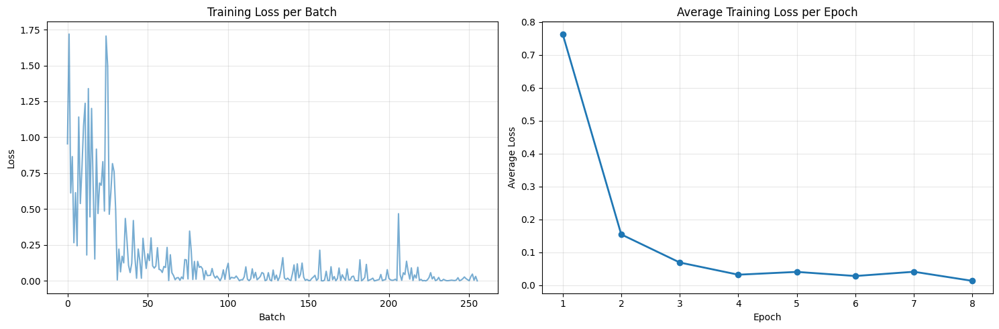

Model saved to: clip_label_model


In [14]:
if TRAIN_MODEL:
    train_model(
        batch_size=16,
        num_epochs=8,
        learning_rate=5e-6
    )
else:
    load_model()

## Test: Find Images by Label

Test the model by searching for images using label queries.

In [15]:
def find_images_by_text(text_query, top_k=5):
    model.eval()
    
    # Encode text query
    text_inputs = processor(
        text=[text_query], 
        return_tensors="pt", 
        padding=True
    ).to(device)
    
    # Encode all images
    similarities = []
    
    with torch.no_grad():
        text_features = model.get_text_features(**text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        
        for i in range(len(dataset)):
            sample = dataset[i]
            image_inputs = processor(images=sample['image'], return_tensors="pt").to(device)
            image_features = model.get_image_features(**image_inputs)
            image_features = image_features / image_features.norm(dim=-1, keepdim=True)
            
            # Calculate similarity
            similarity = (text_features @ image_features.T).item()
            similarities.append((i, similarity, sample))
    
    # Sort by similarity
    similarities.sort(key=lambda x: x[1], reverse=True)
    
    # Display top-k results
    fig, axes = plt.subplots(1, top_k, figsize=(4*top_k, 4))
    if top_k == 1:
        axes = [axes]
    
    for idx, (i, sim, sample) in enumerate(similarities[:top_k]):
        axes[idx].imshow(sample['image'])
        axes[idx].set_title(f"Label: {sample['label']}\nSimilarity: {sim:.3f}")
        axes[idx].axis('off')
    
    plt.tight_layout()
    plt.show()
    
    return similarities[:top_k]

Searching for: 'food'


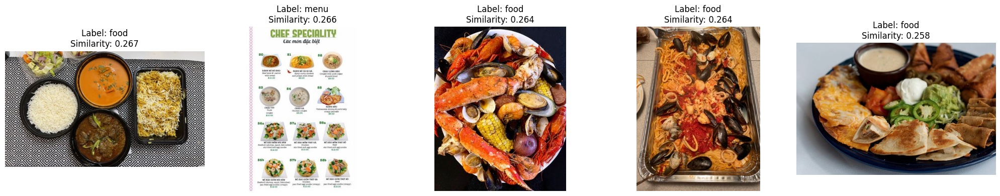

In [16]:
print("Searching for: 'food'")
results = find_images_by_text("food", top_k=5)

Query: 'drink'


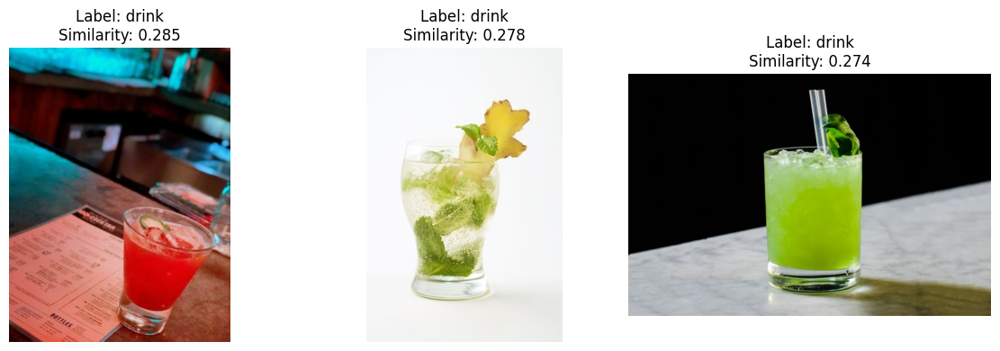

Query: 'menu'


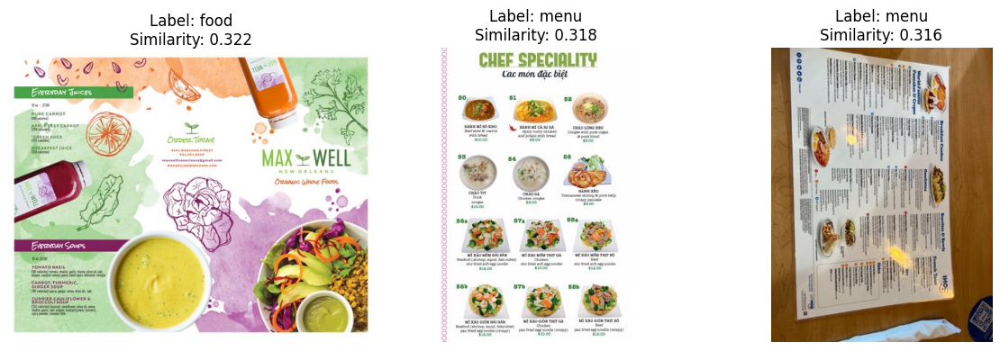

Query: 'inside restaurant'


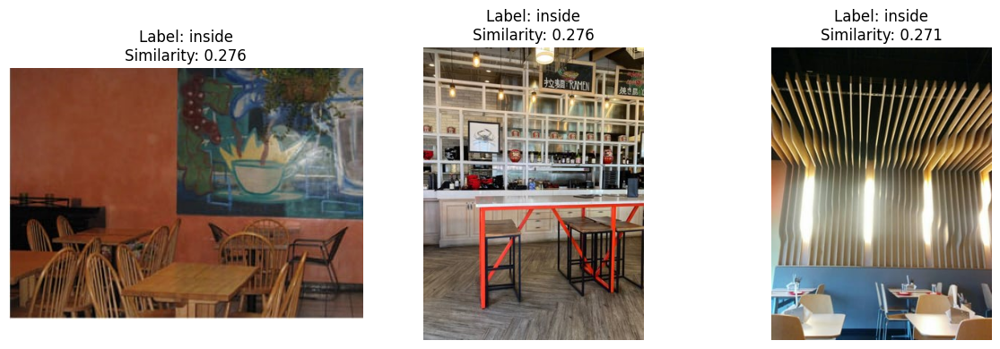

Query: 'outside building'


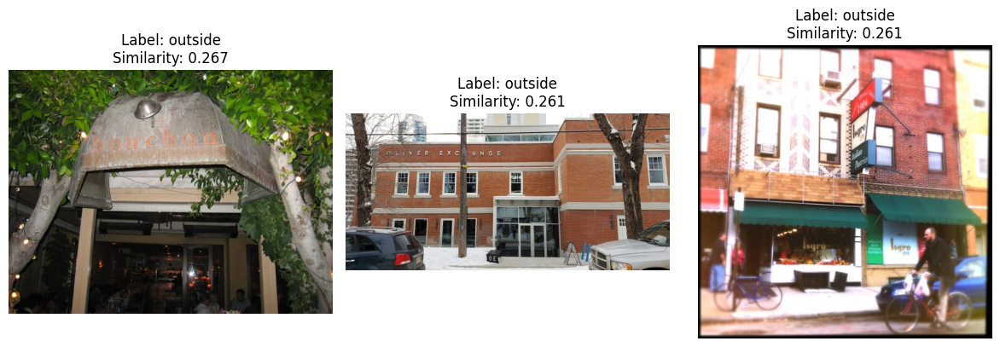

Query: 'an amazing pie'


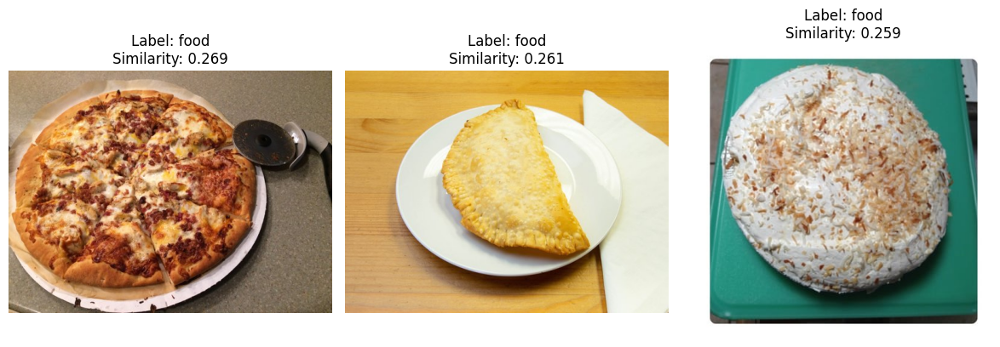

Query: 'I love pizza and I love pasta'


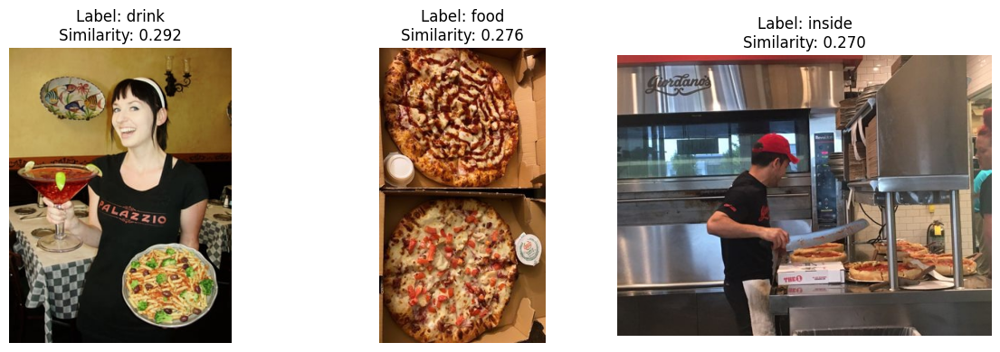

In [17]:
queries = [
    "drink",
    "menu",
    "inside restaurant",
    "outside building",
    "an amazing pie",
    "I love pizza and I love pasta"
]

for query in queries:
    print(f"Query: '{query}'")
    find_images_by_text(query, top_k=3)

## Predict Label for New Image

Use CLIP to predict the label of a given image by comparing it against all possible labels.

In [18]:
def predict_label_and_caption(image_path, top_captions=5):
    model.eval()
    
    # Load image
    if isinstance(image_path, (str, Path)):
        image = Image.open(image_path).convert('RGB')
    else:
        image = image_path
    
    # Get possible labels and all captions
    possible_labels = subset_df['label'].unique().tolist()
    all_captions = subset_df['caption'].unique().tolist()
    
    with torch.no_grad():
        # Encode image
        image_inputs = processor(images=image, return_tensors="pt").to(device)
        image_features = model.get_image_features(**image_inputs)
        image_features = image_features / image_features.norm(dim=-1, keepdim=True)
        
        # Predict label
        text_inputs = processor(text=possible_labels, return_tensors="pt", padding=True).to(device)
        text_features = model.get_text_features(**text_inputs)
        text_features = text_features / text_features.norm(dim=-1, keepdim=True)
        
        label_similarity = (image_features @ text_features.T).squeeze(0)
        probs = torch.nn.functional.softmax(label_similarity, dim=0)
        
        predicted_idx = label_similarity.argmax().item()
        predicted_label = possible_labels[predicted_idx]
        confidence = probs[predicted_idx].item()
        
        # Predict captions in batches
        batch_size = 32
        caption_similarities = []
        
        for i in range(0, len(all_captions), batch_size):
            batch_captions = all_captions[i:i+batch_size]
            caption_inputs = processor(text=batch_captions, return_tensors="pt", padding=True, truncation=True).to(device)
            caption_features = model.get_text_features(**caption_inputs)
            caption_features = caption_features / caption_features.norm(dim=-1, keepdim=True)
            
            batch_sim = (image_features @ caption_features.T).squeeze(0)
            caption_similarities.extend(batch_sim.cpu().tolist())
        
        # Get top captions
        caption_scores = list(zip(all_captions, caption_similarities))
        caption_scores.sort(key=lambda x: x[1], reverse=True)
        top_caption_results = caption_scores[:top_captions]
    
    # Display results
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    ax.imshow(image)
    ax.axis('off')
    
    result_text = f"Predicted Label: {predicted_label} ({confidence:.1%})\n\n"
    result_text += "Top Matching Captions:\n"
    for i, (caption, score) in enumerate(top_caption_results, 1):
        # Truncate long captions for display
        display_caption = caption if len(caption) <= 60 else caption[:57] + "..."
        result_text += f"{i}. [{score:.3f}] {display_caption}\n"
    
    plt.title(result_text, fontsize=11, ha='left', loc='left', pad=20)
    plt.tight_layout()
    plt.show()
    
    # Print detailed results
    print(f"Predicted Label: {predicted_label}")
    print(f"Confidence: {confidence:.1%}\n")
    print(f"Top {top_captions} Matching Captions:")
    for i, (caption, score) in enumerate(top_caption_results, 1):
        print(f"\n{i}. Similarity: {score:.4f}")
        print(f"   {caption}")
    
    return {
        'label': predicted_label,
        'confidence': confidence,
        'captions': top_caption_results,
        'all_label_scores': {label: prob.item() for label, prob in zip(possible_labels, probs)}
    }

Testing with image: mZ5EJ3lQwlbc2MNqzleV7A
Actual label: food



) missing from font(s) DejaVu Sans.cg3800000gn/T/ipykernel_48481/3965297648.py:63: UserWarning: Glyph 13 (
  plt.tight_layout()
) missing from font(s) DejaVu Sans.-ai-project/.venv/lib/python3.13/site-packages/IPython/core/pylabtools.py:170: UserWarning: Glyph 13 (
  fig.canvas.print_figure(bytes_io, **kw)


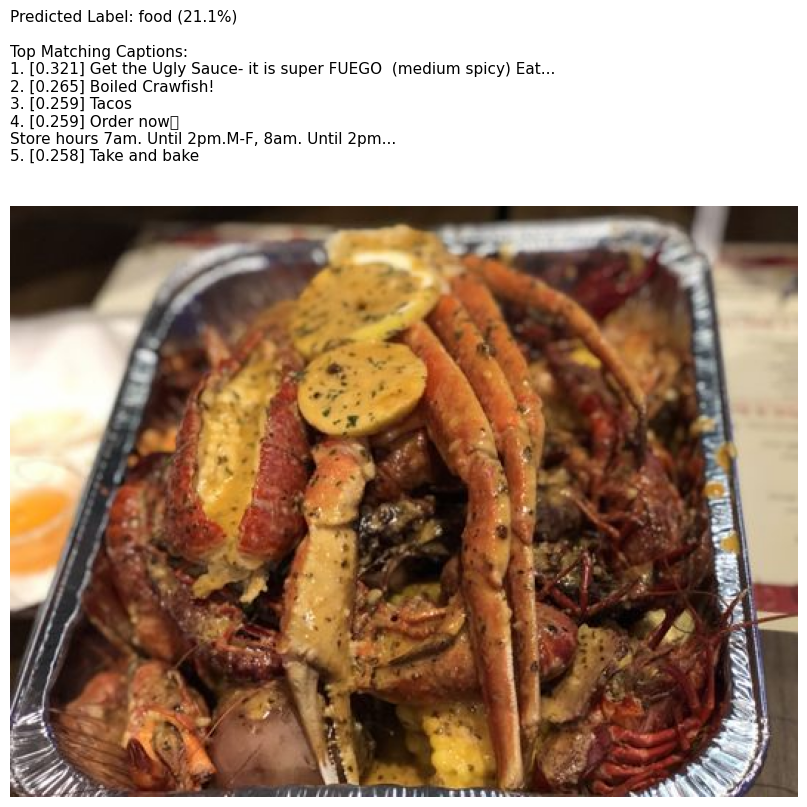

Predicted Label: food
Confidence: 21.1%

Top 5 Matching Captions:

1. Similarity: 0.3214
   Get the Ugly Sauce- it is super FUEGO  (medium spicy) Eat til you sweat!!

2. Similarity: 0.2650
   Boiled Crawfish!

3. Similarity: 0.2593
   Tacos

4. Similarity: 0.2591
   Order now
Store hours 7am. Until 2pm.M-F, 8am. Until 2pm. sat/ sun.

5. Similarity: 0.2577
   Take and bake


In [19]:
import random

test_sample = dataset[random.randint(0, len(dataset) - 1)]

print(f"Testing with image: {test_sample['photo_id']}")
print(f"Actual label: {test_sample['label']}\n")

results = predict_label_and_caption(test_sample['image'], top_captions=5)

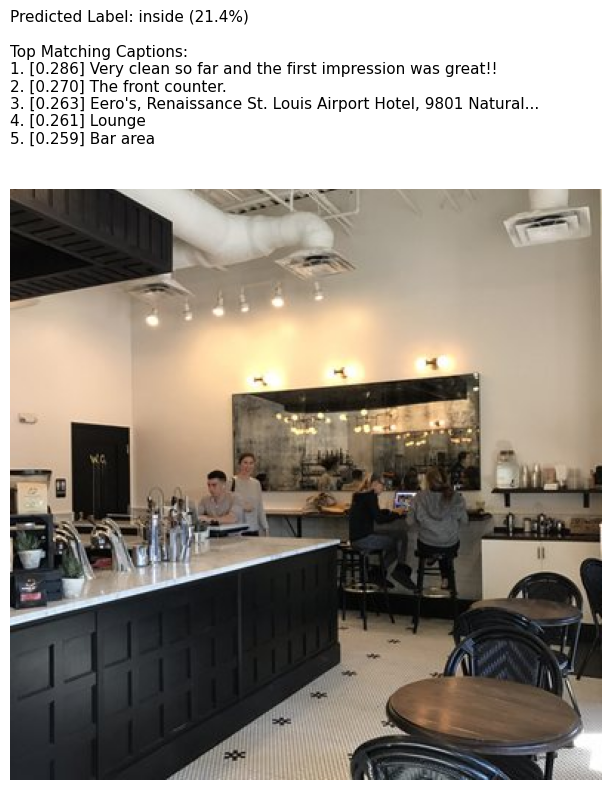

Predicted Label: inside
Confidence: 21.4%

Top 5 Matching Captions:

1. Similarity: 0.2858
   Very clean so far and the first impression was great!!

2. Similarity: 0.2704
   The front counter.

3. Similarity: 0.2634
   Eero's, Renaissance St. Louis Airport Hotel, 9801 Natural Bridge Road, St. Louis, Missouri

4. Similarity: 0.2612
   Lounge

5. Similarity: 0.2593
   Bar area


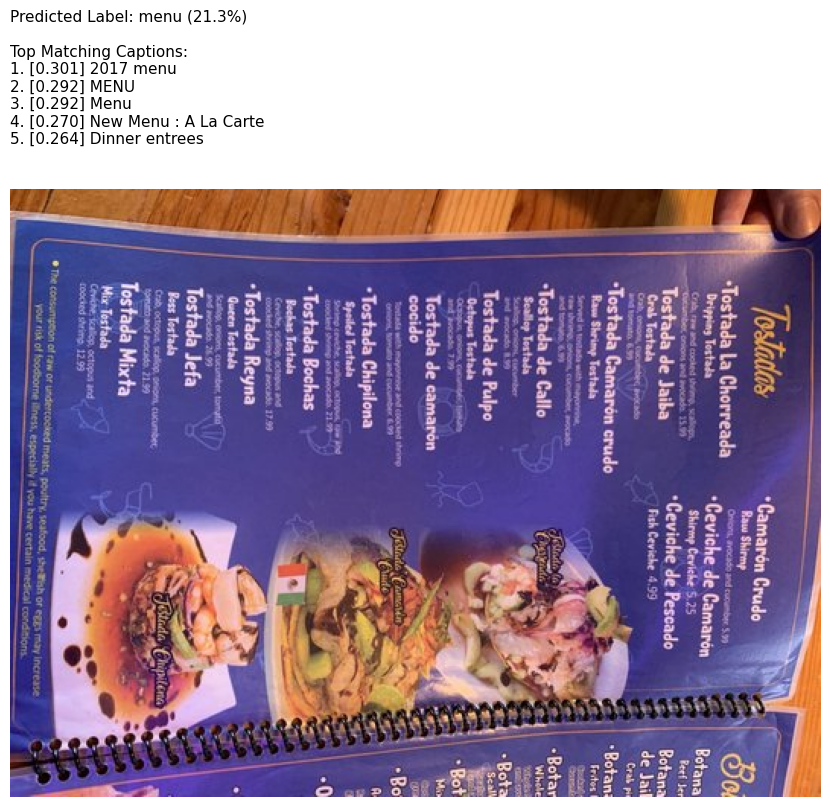

Predicted Label: menu
Confidence: 21.3%

Top 5 Matching Captions:

1. Similarity: 0.3015
   2017 menu

2. Similarity: 0.2925
   MENU

3. Similarity: 0.2925
   Menu

4. Similarity: 0.2699
   New Menu : A La Carte

5. Similarity: 0.2640
   Dinner entrees


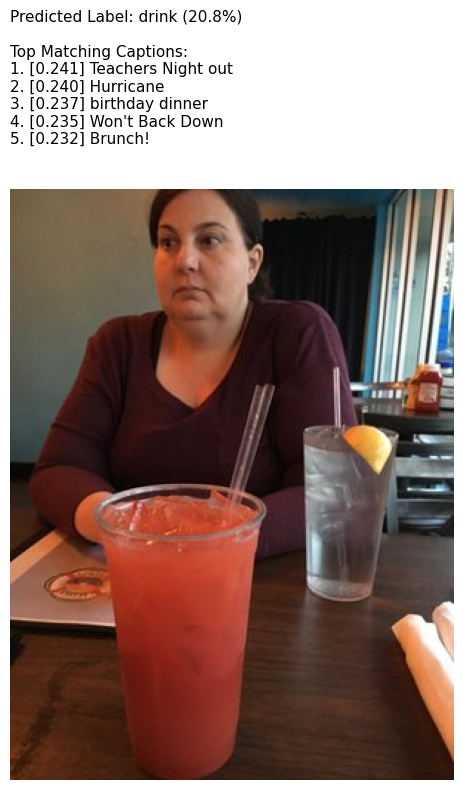

Predicted Label: drink
Confidence: 20.8%

Top 5 Matching Captions:

1. Similarity: 0.2411
   Teachers Night out

2. Similarity: 0.2403
   Hurricane

3. Similarity: 0.2372
   birthday dinner

4. Similarity: 0.2351
   Won't Back Down

5. Similarity: 0.2320
   Brunch!


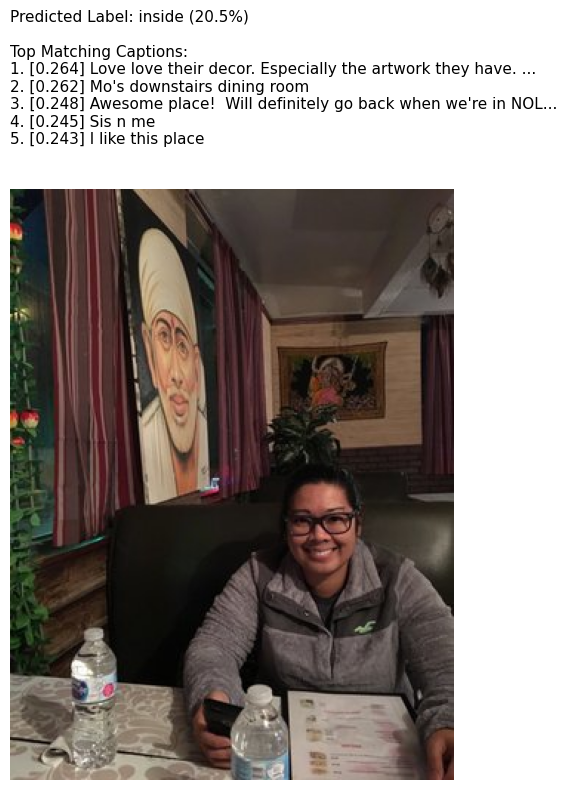

Predicted Label: inside
Confidence: 20.5%

Top 5 Matching Captions:

1. Similarity: 0.2638
   Love love their decor. Especially the artwork they have. And the warm dark cozy feel of the place. It's lovely.

2. Similarity: 0.2617
   Mo's downstairs dining room

3. Similarity: 0.2481
   Awesome place!  Will definitely go back when we're in NOLA again!!!

4. Similarity: 0.2447
   Sis n me

5. Similarity: 0.2433
   I like this place


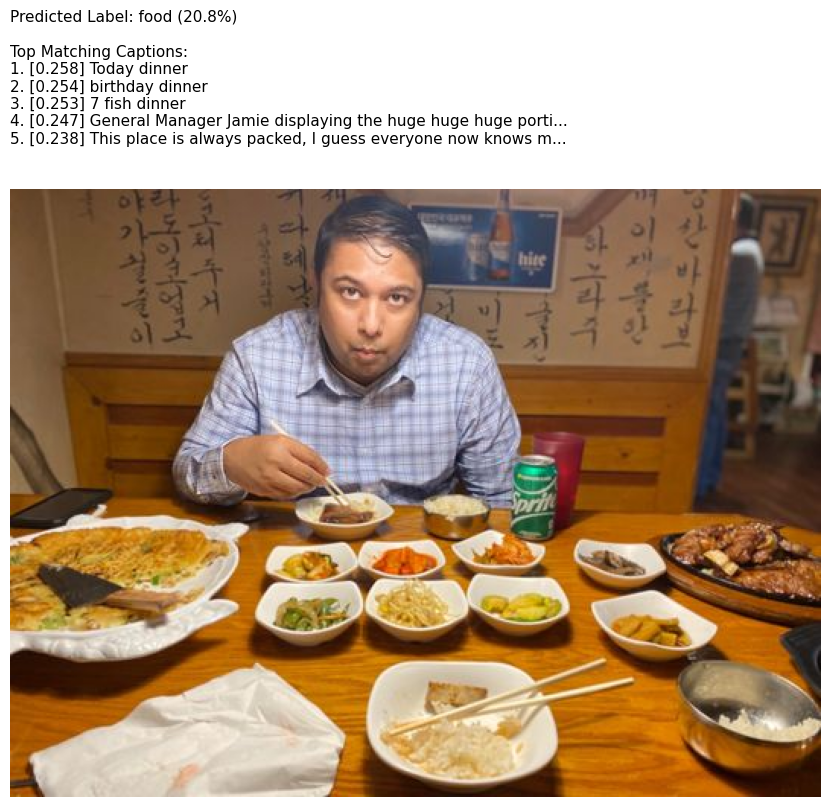

Predicted Label: food
Confidence: 20.8%

Top 5 Matching Captions:

1. Similarity: 0.2579
   Today dinner

2. Similarity: 0.2544
   birthday dinner

3. Similarity: 0.2531
   7 fish dinner

4. Similarity: 0.2474
   General Manager Jamie displaying the huge huge huge portions at Palazzio

5. Similarity: 0.2378
   This place is always packed, I guess everyone now knows my secret.


In [20]:
for index, row in uncaptioned_subset.iterrows():
    photo_path = images_dir / f"{row["photo_id"]}.jpg"

    if isinstance(photo_path, Path) and photo_path.exists():
        predict_label_and_caption(photo_path, top_captions=5)